## Unsupervised Learning

#### Camila da Silva Limons

This project consists in grouping data from a set of images, using different algorithms and evaluating their results. The dataset used was: Natural Images 100.  

In [4]:
import time
import os
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input

from sklearn import metrics
from scipy.spatial.distance import cdist

from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score
from sklearn.metrics import silhouette_score
from sklearn.metrics import silhouette_samples

os.environ["CUDA_VISIBLE_DEVICES"] = "-1" 


### 1. Database

To perform the grouping of images, it was necessary to initially extract the features of the images, in order to have a more compact (and “significant”) representation of the data before applying the machine learning algorithm.
For the extraction of the features, the pre-trained keras ResNet50 model was used, and it was chosen the last network layer before the classification layer. The pre-processing of the images was performed with the keras pre-input function for the ResNet50 model.

In [5]:
model = ResNet50(weights='imagenet', include_top=False, pooling='avg', input_shape=(224, 224, 3))

In [12]:
#Function that loads the images and extract the features using pre-treined ResNet50

def load_and_extract_features(model, img_path):   
    img = image.load_img(img_path, target_size=(224,224))
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)
    features = model.predict(x)
    return features

In [13]:
#Extracting features and saving to a dataframe

categories = ["airplane", "car", "cat", "dog", "person", "flower", "fruit", "motorbike"]
diret = 'natural_images_100/natural_images_100/'

dataset = pd.DataFrame(columns=['Name', 'Image'])
i = 0
                       
for category in categories:
    j = 0
    path = diret + category
    for img in os.listdir(path):
        img_name = os.listdir(path)[j]
        img_path = path + '/' + img_name
        features = load_and_extract_features(model, img_path)         
        dataset.loc[i,'Name'] = img_name
        dataset.loc[i,'Image'] = features
        i = i+1
        j = j+1   

In [9]:
# Saving the images' categories in an array X and the features in an array Y.They're going to be used in the clustering algorithms 

cont = dataset['Image'].count()

X = []
Y = []

for i in range(0,cont):
    imagem = dataset.loc[i,'Image']
    nome = dataset.loc[i,'Name'][:(dataset.loc[i,'Name'].find('_'))]
    a = np.reshape(imagem, 2048)
    X.append(a)   
    Y.append(nome)
    
X = np.asarray(X)
Y = np.asarray(Y)


### 2 - Applying the Clusterin Algorithm - KMeans

First, a clustering algorithm, known as K-means, will be applied. It clusters data by trying to separate samples in n groups of equal variance. This algorithm requires the number of clusters to be specified. 

In [10]:
def train_kmeans (data, k=8, init='k-means++', n_init=10, max_iter=300,
                   precompute_distances='auto', algorithm='auto', verbose=0, random_state=133):    
    
    model = KMeans(n_clusters=k, init=init, n_init=n_init, max_iter=max_iter,
                   precompute_distances=precompute_distances, algorithm=algorithm,
                   random_state=random_state, verbose=verbose)
    model.fit(data)
    
    model.predict(data)      
    
    return model.labels_

To evaluate the algorithm, it will be used the methods:

+ **Quantitative Evaluation**

+ *External Evaluation* - Adjusted Rand Index
+ *Internal Evaluation* - Silhouette Coefficiente
+ Elbow Method

+ **Subjective Evaluation**

+ Visualization of the clusters

**2.1 - Tests and Quantitative Evaluation**

In this case, we know the correct number of clusters, once the data is labeled. In the first application of the algorithm, we're going to use tue correct number of clusters (k=8) and random_state = 133 for centroid initialization.

In [16]:
y_kmeans = train_kmeans(X, k=8)
print('External Evaluation - Adjusted Rand Index', round(adjusted_rand_score(Y, y_kmeans), 4))
print('Internal evaluation - Silhouette Coefficient', round(silhouette_score(X, y_kmeans), 4))


External Evaluation - Adjusted Rand Index 0.9801
Internal evaluation - Silhouette Coefficient 0.1714


We can verify that the Adjusted Rand Index has a very good value, close to the maximum one.
As for the Silhouette Coefficient, it appears that the groups generated are not so dissimilar to each other, since they have a calue close to 0, which indicates an overlap of groups.
In the next test, we will use a smaller number of clusters (k = 6) and the same random state.

In [17]:
y_kmeans = train_kmeans(X, k=6)
print('External Evaluation - Adjusted Rand Index', round(adjusted_rand_score(Y, y_kmeans), 4))
print('Internal Evaluatio - Silhouette Coefficient', round(silhouette_score(X, y_kmeans), 4))

External Evaluation - Adjusted Rand Index 0.7565
Internal Evaluatio - Silhouette Coefficient 0.1676


As expected, the indexes decreased a little, since this is not the correct number of clusters and, there was probably a merge of two close categories. This can be confirmed when we visualize the groups lates. 
Now, let's test the algorithm with a larger number of clusters (k=10).

In [18]:
y_kmeans = train_kmeans(X, k=10)
print('External Evaluation - Adjusted Rand Index', round(adjusted_rand_score(Y, y_kmeans), 4))
print('Internal Evaluatio - Silhouette Coefficient', round(silhouette_score(X, y_kmeans), 4))

External Evaluation - Adjusted Rand Index 0.9139
Internal Evaluatio - Silhouette Coefficient 0.1732


The result worsened slightly in relation to the number of clusters equal to 8, but we found that the dissimilarity between the groups increased (the internal index increased).

Now, we're goint to test with the correct number of clusters (k=8), but using the random initialization. 

In [19]:
y_kmeans = train_kmeans(X, init='random')
print('External Evaluation - Adjusted Rand Index', round(adjusted_rand_score(Y, y_kmeans), 4))
print('Internal Evaluatio - Silhouette Coefficient', round(silhouette_score(X, y_kmeans), 4))

External Evaluation - Adjusted Rand Index 0.8352
Internal Evaluatio - Silhouette Coefficient 0.1721


It's possible to see that the result was worse than using random_state=300. Probably, in this case, the centroids weren't well chosen. 

We will now check in a graph, the variation of the external index with the variation in the number of clusters.

In [20]:
def do_ajusted_random_index_and_plot(data, max_clusters):
    min_clusters = 1

    clusters_range = range(min_clusters, max_clusters + 1)

    aris = []
    
    for k in clusters_range:
        model = KMeans(n_clusters=k, random_state=0)
        model.fit(data)
        
        ari = adjusted_rand_score(Y, model.labels_)
        aris.append(ari)
        
    _ = plt.plot(clusters_range, aris, '-o')
    _ = plt.title('Ajusted Random Index x Number of Clusters')
    _ = plt.xlabel('Number of clusters')
    _ = plt.ylabel('Ajusted Random Index')
    _ = plt.xticks(clusters_range)
    plt.show()

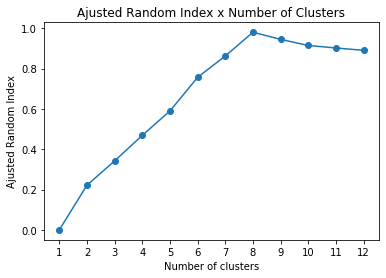

In [21]:
do_ajusted_random_index_and_plot(X, max_clusters=12)

We will now implement the elbow method to see how the variation in the number of clusters influences the final clustering.
The elbow method checks the inertia values according to the variation in the number of clusters. Inertia measures how cohesite the clusters are.

In [22]:
def elbow_method(data, max_clusters):
    
    clusters_range = range(1, max_clusters + 1)
       
    inercia = []  
    
    for k in clusters_range:
        
        model = KMeans(n_clusters=k, random_state=0)
        model.fit(data)       
        
        inercia.append(model.inertia_)        

    plt.plot(clusters_range, inercia, '-o') 
    plt.xlabel('Número de Clusters') 
    plt.ylabel('Inércia') 
    plt.title('O Método Elbow') 
    plt.show() 
    
    

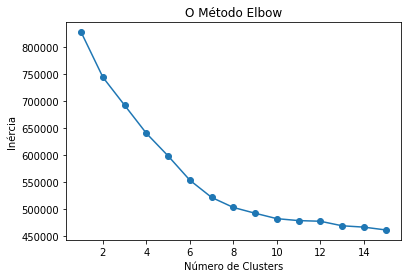

In [23]:
elbow_method(X, max_clusters=15)

We can realize that the elbow of the curve, which indicates a good number of groups, is close to k=8.

#### 2.2 -  Subjective Evaluation

We will now redo some of the previous tests and view the groups in order to understand better the creation of clusters.

In [24]:
def show_clusters(n_clusters):
    for k in range(0, n_clusters):
        print ('Cluster =', k)
        fig=plt.figure(figsize=(18, 10))
        colunas = 8
        j = 0
        for i in range(0,cont):
            if y_kmeans[i] == k:
                j = j+1            
                linhas = ((y_kmeans==k).sum())/colunas + 1           
                img_path = diret + '/' + Y[i] + '/' + dataset.loc[i,'Name']
                img = image.load_img(img_path, color_mode='rgba')
                fig.add_subplot(linhas, colunas, j)
                plt.imshow(img)
                plt.axis('off')            
        plt.show()      
 

**2.2.1 Using the right number of clusters k= 8 and random_state = 133**

Cluster = 0


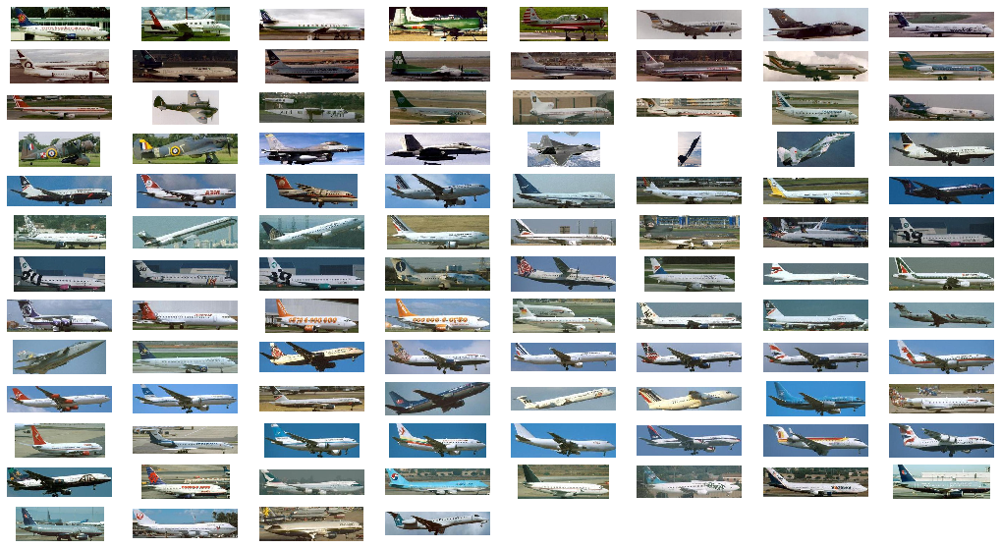

Cluster = 1


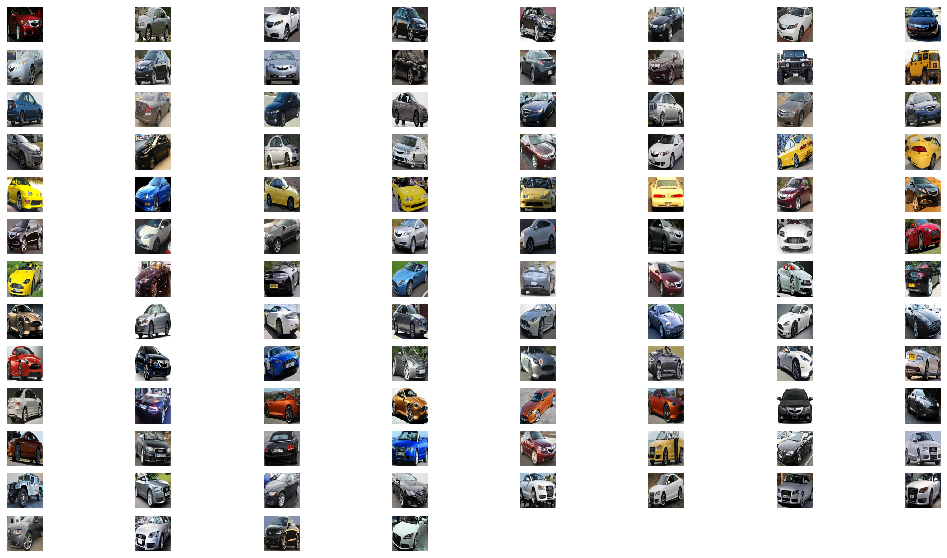

Cluster = 2


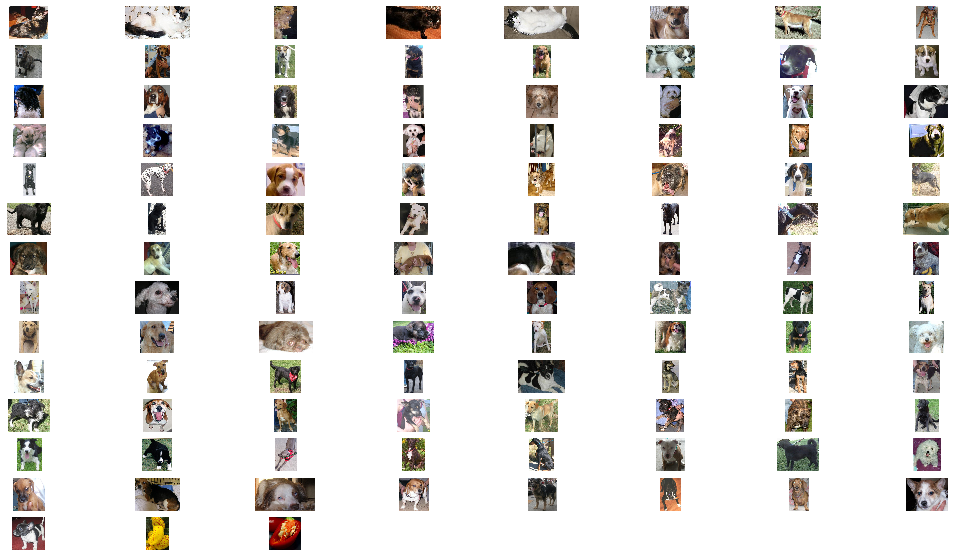

Cluster = 3


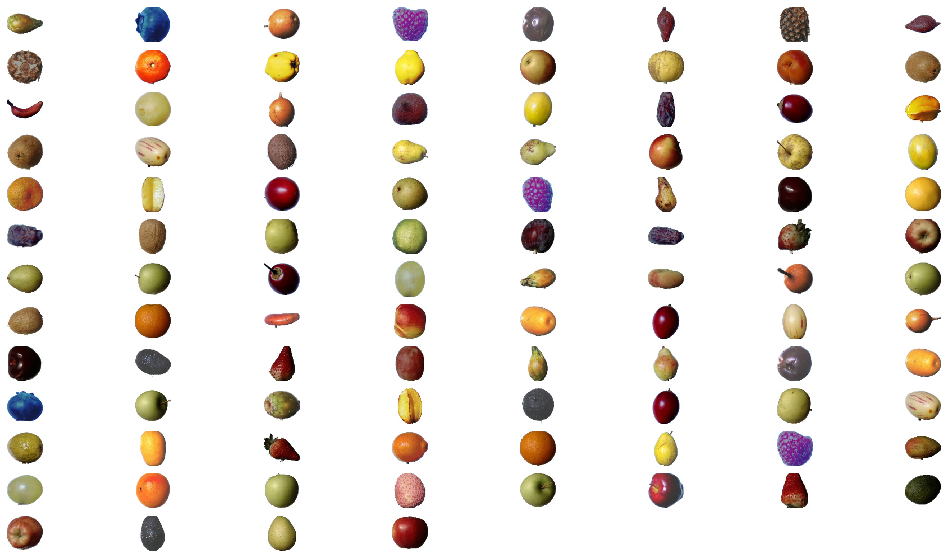

Cluster = 4


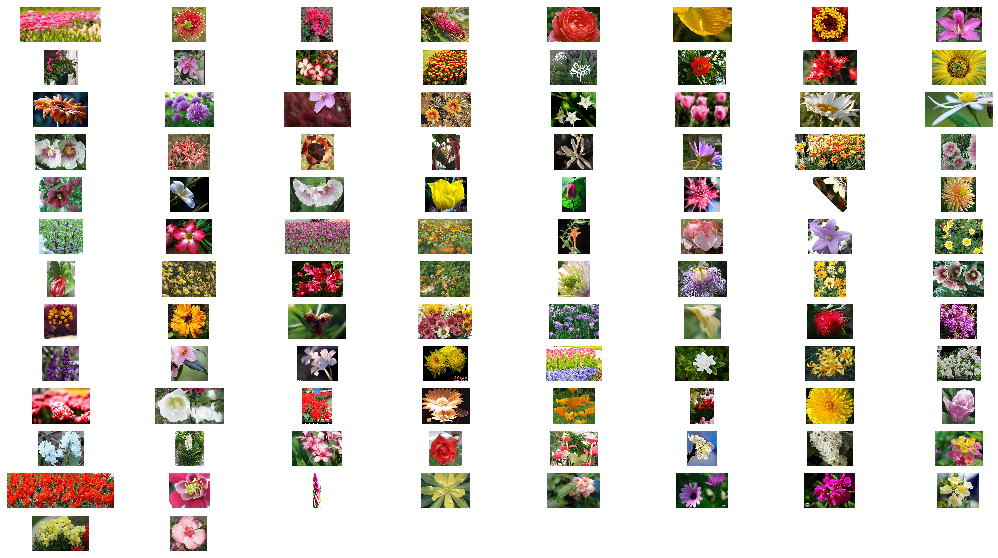

Cluster = 5


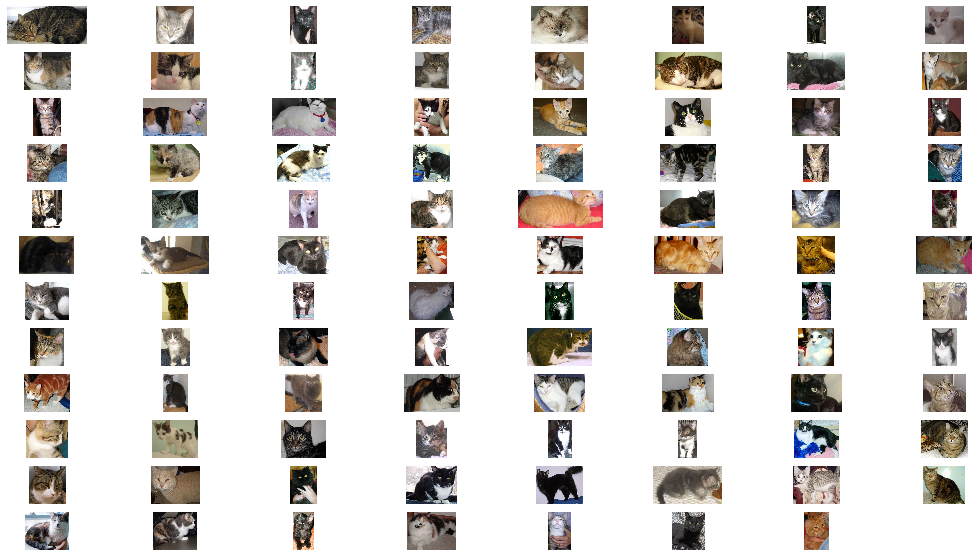

Cluster = 6


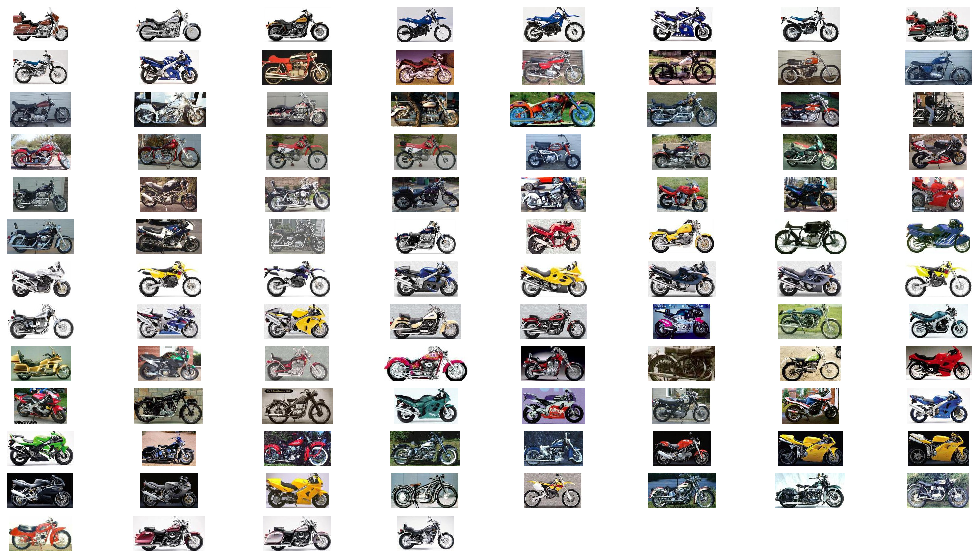

Cluster = 7


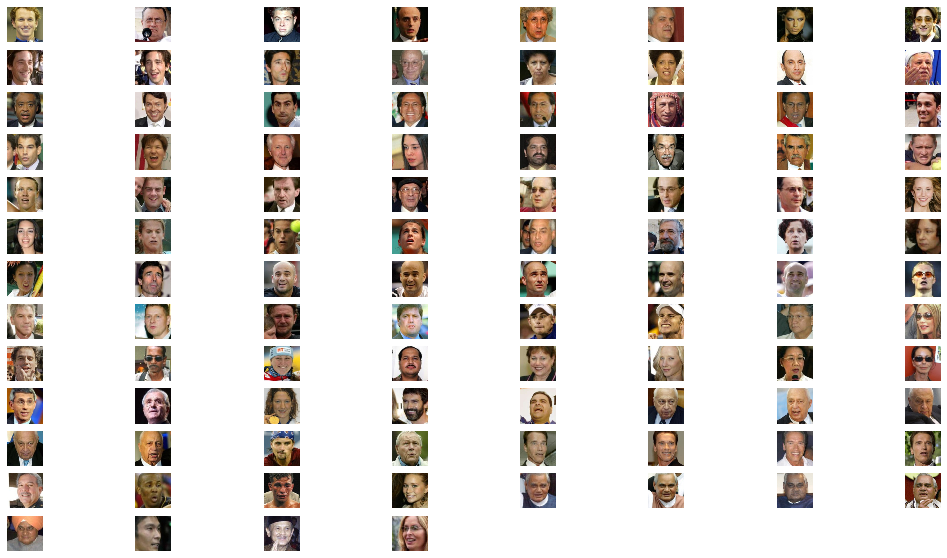

In [25]:
n_clusters = 8
y_kmeans = train_kmeans(X, k=n_clusters)
show_clusters(n_clusters)

**2.2.2 Using a smaller number of clusters k=6**

Cluster = 0


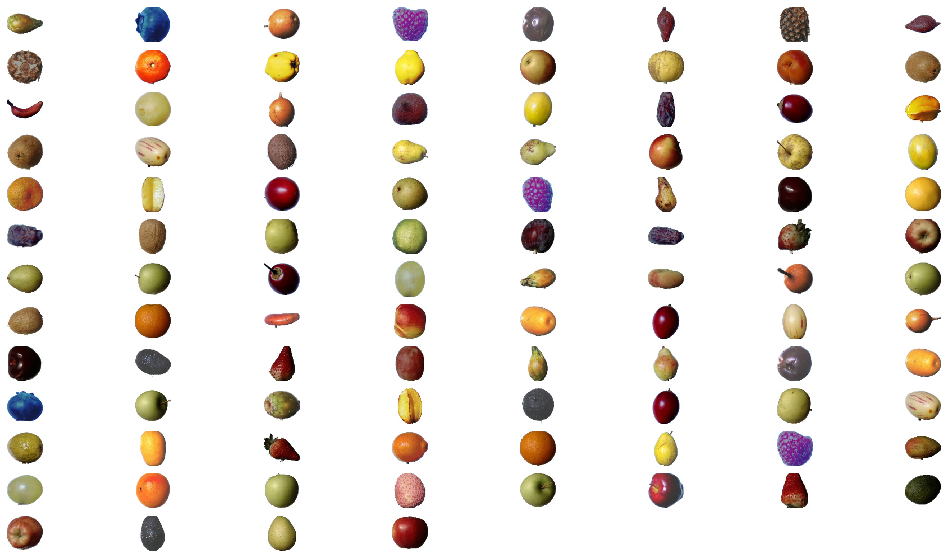

Cluster = 1


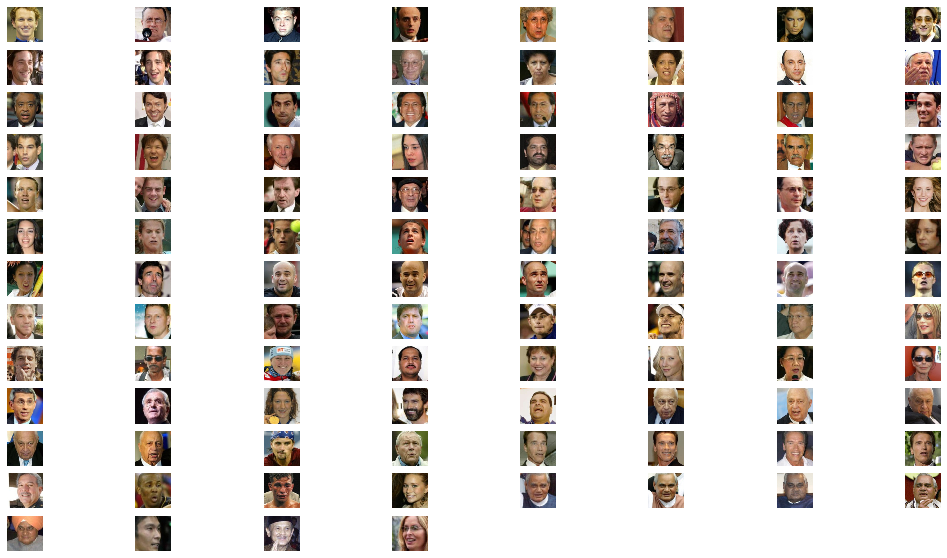

Cluster = 2


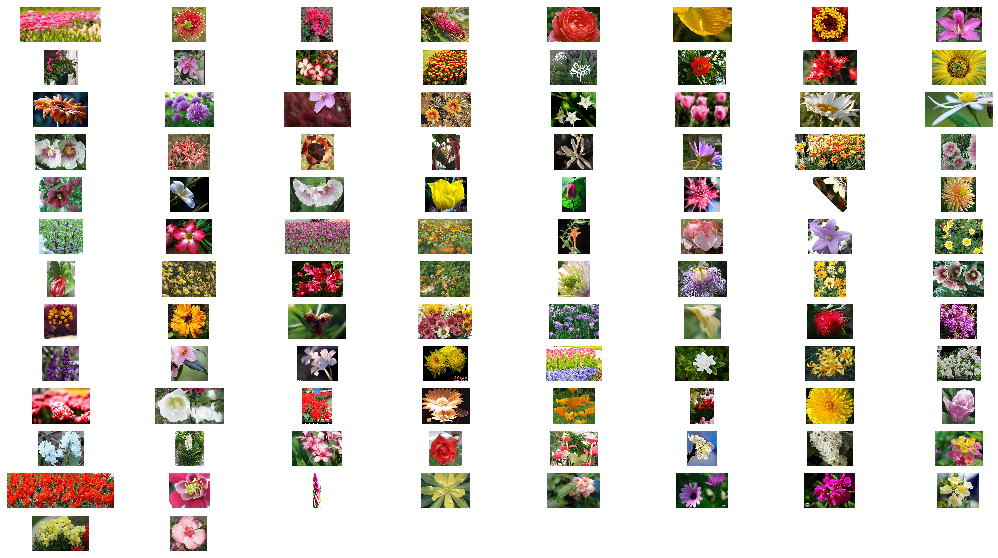

Cluster = 3


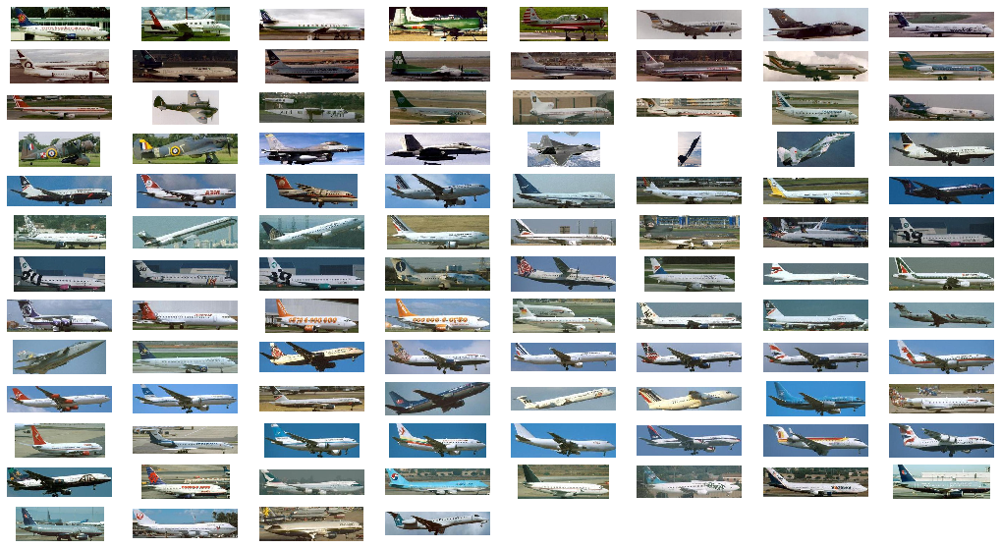

Cluster = 4


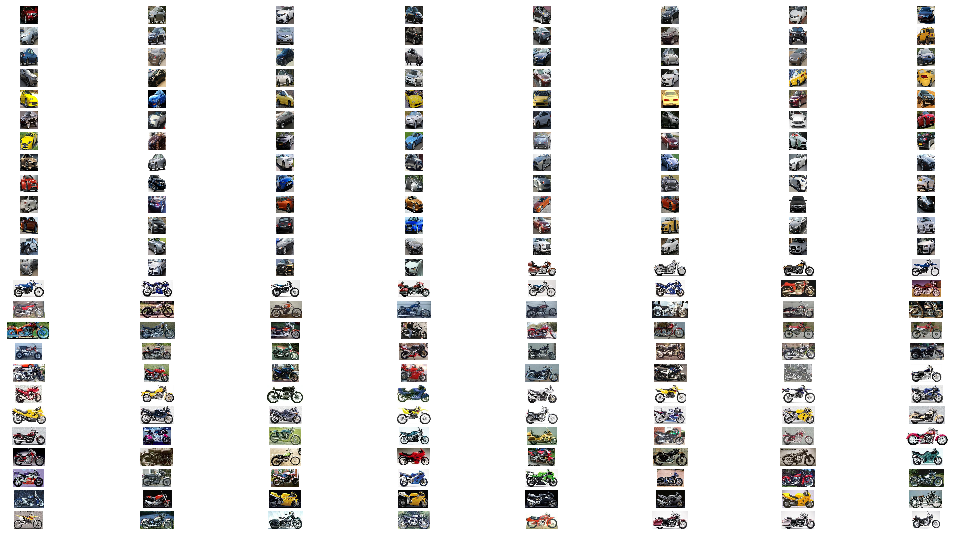

Cluster = 5


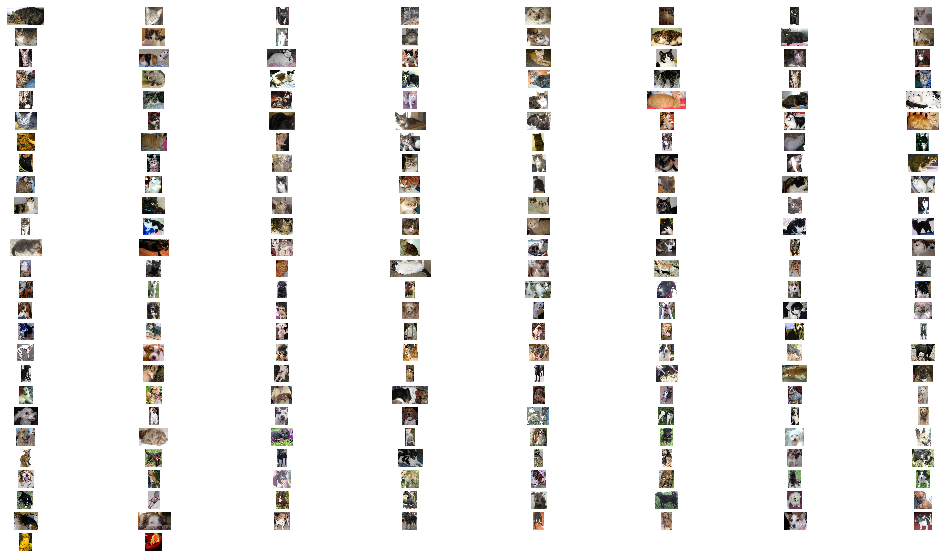

In [26]:
n_clusters = 6
y_kmeans = train_kmeans(X, k=n_clusters)
show_clusters(n_clusters)

**2.2.3 Using a bigger number of clusters k=10**

n_clusters = 10
y_kmeans = train_kmeans(X, k=n_clusters)
show_clusters(n_clusters)

**2.2.4 Using the right number of clusters k=8 and a random initialization**

Cluster = 0


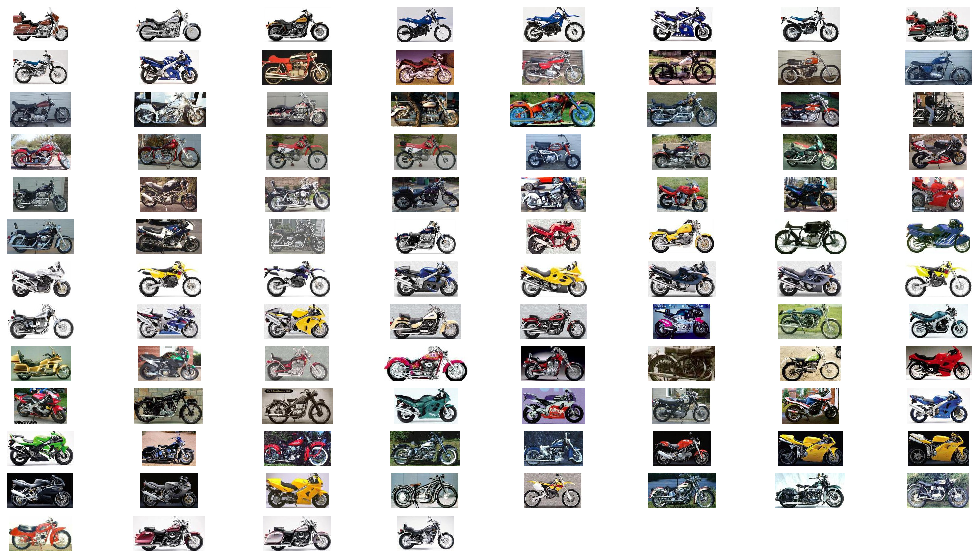

Cluster = 1


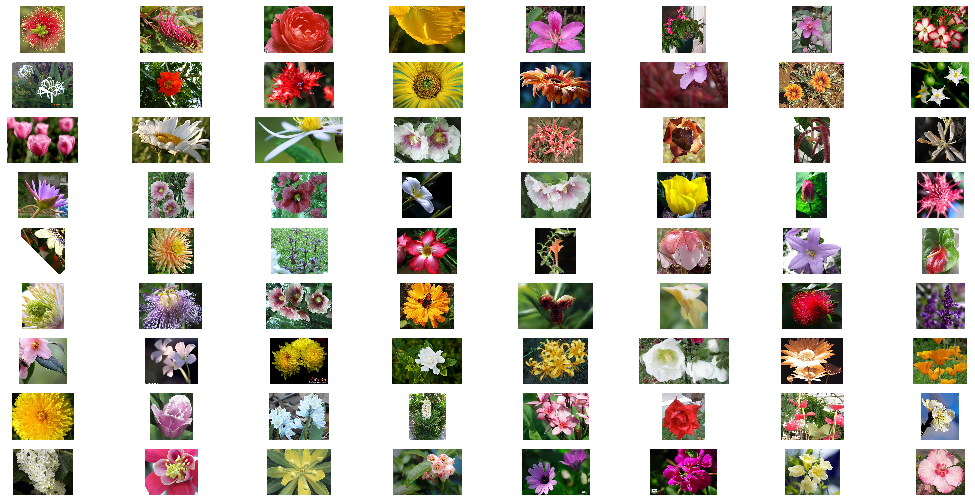

Cluster = 2


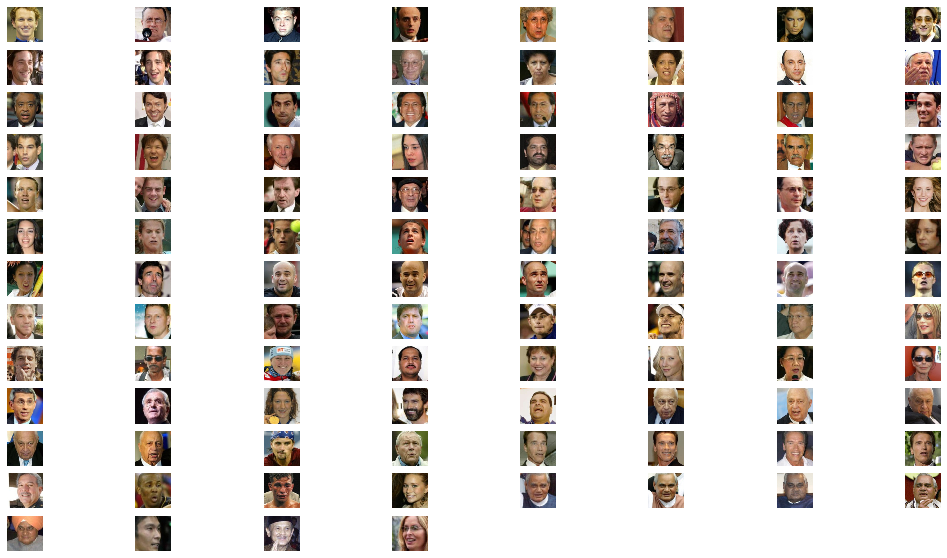

Cluster = 3


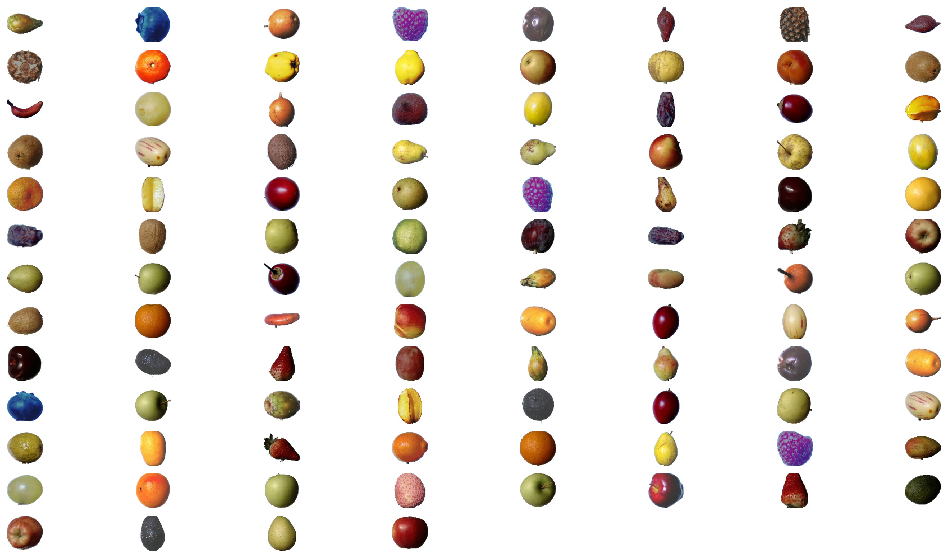

Cluster = 4


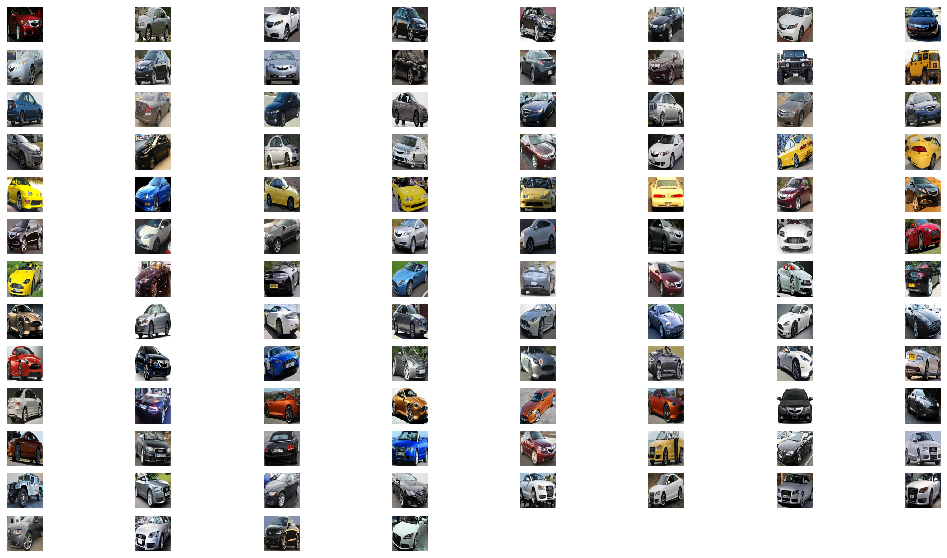

Cluster = 5


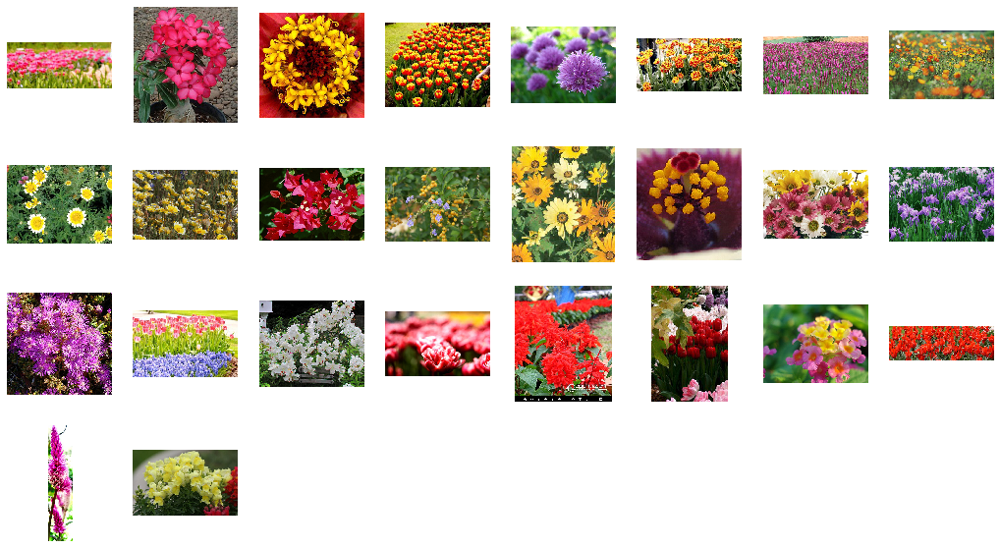

Cluster = 6


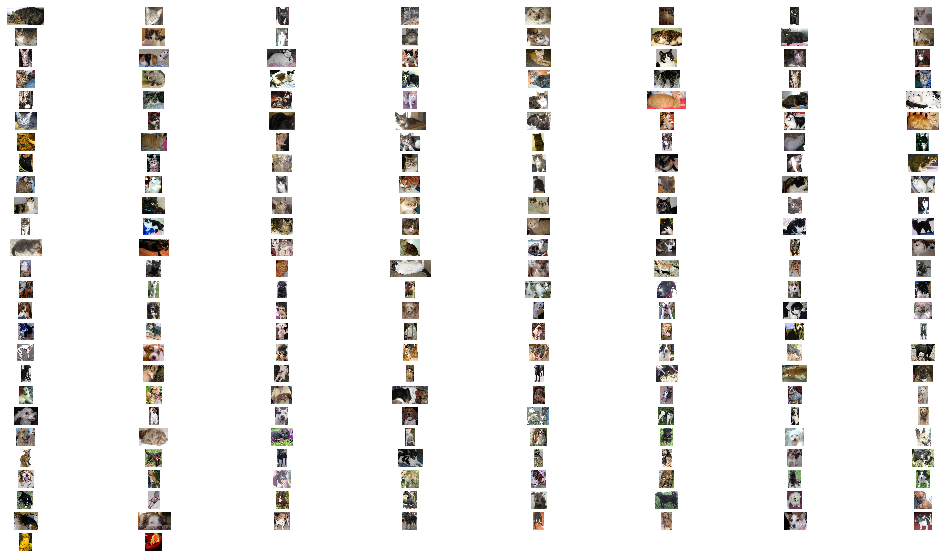

Cluster = 7


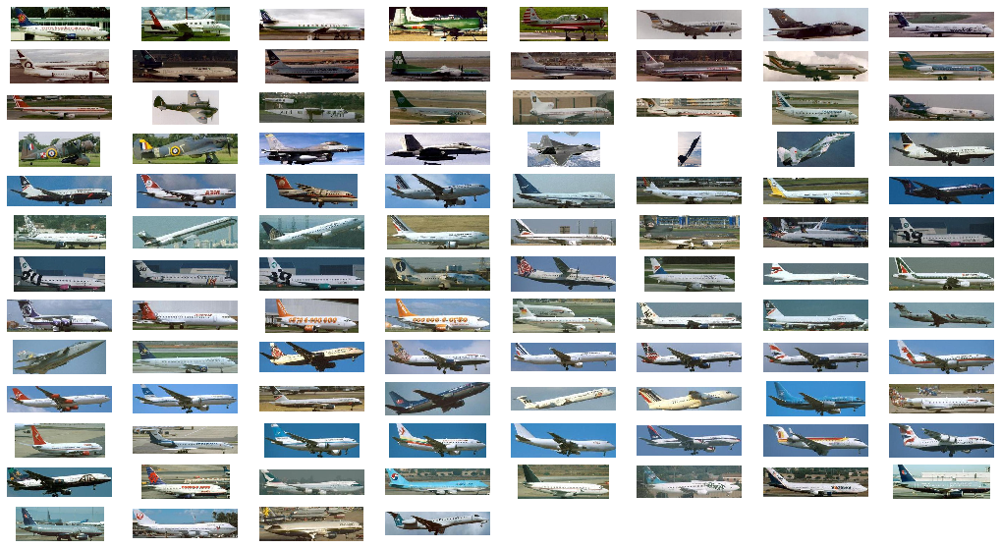

In [28]:
n_clusters = 8
y_kmeans = train_kmeans(X, k=n_clusters, init='random')
show_clusters(n_clusters)

**Comments about the Subject Evaluation:**  

+ It's possible to verify that, in the first clustering (k=8),the grouping was almost perfect, with some minor errors in more similar items, such as placing a picture of a cat within the group of dogs.

+ With a smaller k, the algorithm joined some more similar groups (car and motorbikes and cats and dogs)

+ Using a bigger k, the algorithm separated the groups that were not so cohesive. There was the creation of two clusters in the cat and airplane categories.

+ In the last example, we see how the choice of initial centroid influences the result. Although the number of clusters was correct, the algorithm significantly failed to clustering cats and dogs into a single group and separate the flowers into two different groups.